In [1]:
import numpy as np
import pandas as pd

%matplotlib inline

np.random.seed(seed=1789)

# generate a daily signal covering one year 2016 in a pandas dataframe
N = 360
df_train = pd.DataFrame({"Date" : pd.date_range(start="2016-01-25", periods=N, freq='D'),
                         "Signal_inc" : (np.arange(N)//40 +  np.arange(N) % 21 + np.random.randn(N)),
                         "Signal_dec" : -(np.arange(N)//40 +  np.arange(N) % 21 + np.random.randn(N))
                        })
min1 , min2 = df_train['Signal_inc'].min(), df_train['Signal_dec'].min()
max1 , max2 = df_train['Signal_inc'].max(), df_train['Signal_dec'].max()
df_train['Signal_mean'] = (df_train['Signal_inc'] + df_train['Signal_dec']) / 2
df_train['Signal_prod'] = (df_train['Signal_inc'] - min1) / (max1 - min1) * (df_train['Signal_dec'] - min2) / (max2 - min2)

In [2]:
df_train.head(12)

,Date,Signal_inc,Signal_dec,Signal_mean,Signal_prod
0,2016-01-25,-1.829677,-1.113173,-1.471425,0.000000
1,2016-01-26,0.613466,0.146614,0.380040,0.075424
2,2016-01-27,3.746120,-1.894112,0.926004,0.159768
3,2016-01-28,4.108057,-5.190707,-0.541325,0.148866
4,2016-01-29,3.216374,-4.803395,-0.793510,0.128634
5,2016-01-30,5.804758,-4.310162,0.747298,0.198710
6,2016-01-31,5.392701,-6.216093,-0.411696,0.173025
7,2016-02-01,8.650159,-6.500653,1.074753,0.247823
8,2016-02-02,6.556589,-8.137777,-0.790594,0.183394
9,2016-02-03,8.439974,-9.279429,-0.419727,0.211840


In [3]:
df_train.tail(12)

,Date,Signal_inc,Signal_dec,Signal_mean,Signal_prod
348,2017-01-07,18.578125,-20.703485,-1.062680,0.167599
349,2017-01-08,21.068875,-22.255633,-0.593379,0.149429
350,2017-01-09,21.823682,-21.742687,0.040497,0.167540
351,2017-01-10,23.191205,-24.074576,-0.441686,0.113819
352,2017-01-11,23.957765,-23.843848,0.056958,0.123772
353,2017-01-12,24.223973,-26.668709,-1.222368,0.045066
354,2017-01-13,24.375471,-25.086641,-0.355585,0.090384
355,2017-01-14,26.853138,-28.129132,-0.637997,0.004091
356,2017-01-15,27.423690,-27.353876,0.034907,0.028819
357,2017-01-16,6.990579,-7.750495,-0.379958,0.196597


<AxesSubplot: xlabel='Date'>

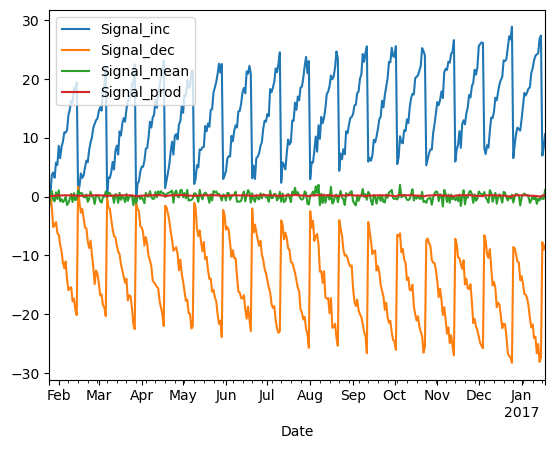

In [4]:
df_train.plot('Date' , ['Signal_inc', 'Signal_dec', 'Signal_mean', 'Signal_prod'])

In [5]:

import pyaf.ForecastEngine as autof
# create a forecast engine. This is the main object handling all the operations
lEngine = autof.cForecastEngine()
# lEngine.mOptions.enable_slow_mode()
lEngine.mOptions.mNbCores = 18
# get the best time series model for predicting one week
lEngine.train(iInputDS = df_train, iTime = 'Date', iSignal = ['Signal_dec' , 'Signal_inc', 'Signal_mean', 'Signal_prod'], iHorizon = 7);
lEngine.getModelInfo() # => relative error 7% (MAPE)


INFO:pyaf.std:TRAINING_ENGINE_START {'Signals': ['Signal_dec', 'Signal_inc', 'Signal_mean', 'Signal_prod'], 'Horizons': {'Signal_dec': 7, 'Signal_inc': 7, 'Signal_mean': 7, 'Signal_prod': 7}}
/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:57: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:57: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:57: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:57: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:57: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:57: RuntimeWarning: overflow encountered 

/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:57: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:57: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:57: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:57: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:57: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:57: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:57: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
/usr/l

/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:57: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:57: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:57: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:57: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:57: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:57: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
/usr/lib/python3/dist-packages/numpy/core/fromnumeric.py:57: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
/usr/l

INFO:pyaf.std:AR_MODEL_DETAIL_END
INFO:pyaf.std:TIME_DETAIL TimeVariable='Date' TimeMin=2016-01-25T00:00:00.000000 TimeMax=2016-11-01T00:00:00.000000 TimeDelta=<DateOffset: days=1> Horizon=7
INFO:pyaf.std:SIGNAL_DETAIL_ORIG SignalVariable='Signal_mean' Length=360  Min=-1.678336 Max=2.023798  Mean=-0.020073 StdDev=0.70176
INFO:pyaf.std:SIGNAL_DETAIL_TRANSFORMED TransformedSignalVariable='_Signal_mean' Min=0.0 Max=1.0  Mean=0.447921 StdDev=0.189556
INFO:pyaf.std:DECOMPOSITION_TYPE 'T+S+R'
INFO:pyaf.std:BEST_TRANSOFORMATION_TYPE '_'
INFO:pyaf.std:BEST_DECOMPOSITION  '_Signal_mean_ConstantTrend_residue_zeroCycle[0.0]_residue_NoAR' [ConstantTrend + NoCycle + NoAR]
INFO:pyaf.std:TREND_DETAIL '_Signal_mean_ConstantTrend' [ConstantTrend]
INFO:pyaf.std:CYCLE_DETAIL '_Signal_mean_ConstantTrend_residue_zeroCycle[0.0]' [NoCycle]
INFO:pyaf.std:AUTOREG_DETAIL '_Signal_mean_ConstantTrend_residue_zeroCycle[0.0]_residue_NoAR' [NoAR]
INFO:pyaf.std:MODEL_PERFS Fit STEP=1 {'MAPE': 1.0007, 'RMSE': 0.7042, 

INFO:pyaf.std:COMPETITION_DETAIL_SHORT_LIST 'Signal_mean' 6 {'Transformation': 'RelDiff_Signal_mean', 'DecompositionType': 'T+S+R', 'Model': 'RelDiff_Signal_mean_ConstantTrend_residue_zeroCycle[0.0]_residue_NoAR', 'Voting': 408.7143, 'Complexity': 'MSSSS', 'Forecast_MASE_1': 0.6374, 'Forecast_MASE_H': 0.6374}
INFO:pyaf.std:COMPETITION_DETAIL_SHORT_LIST 'Signal_mean' 7 {'Transformation': 'RelDiff_Signal_mean', 'DecompositionType': 'T+S+R', 'Model': 'RelDiff_Signal_mean_LinearTrend_residue_Cycle_5_residue_NoAR', 'Voting': 408.7143, 'Complexity': 'MSSSS', 'Forecast_MASE_1': 0.6374, 'Forecast_MASE_H': 0.6374}
INFO:pyaf.std:COMPETITION_DETAIL_SHORT_LIST 'Signal_mean' 8 {'Transformation': 'RelDiff_Signal_mean', 'DecompositionType': 'T+S+R', 'Model': 'RelDiff_Signal_mean_LinearTrend_residue_Seasonal_DayOfWeek_residue_NoAR', 'Voting': 408.7143, 'Complexity': 'MSSSS', 'Forecast_MASE_1': 0.6374, 'Forecast_MASE_H': 0.6374}
INFO:pyaf.std:COMPETITION_DETAIL_SHORT_LIST 'Signal_mean' 9 {'Transformati

/home/antoine/dev/python/packages/timeseries/pyaf/pyaf/TS/Plots.py:197: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(horizon, 1, figsize=(12, horizon / 2.54), squeeze = True)


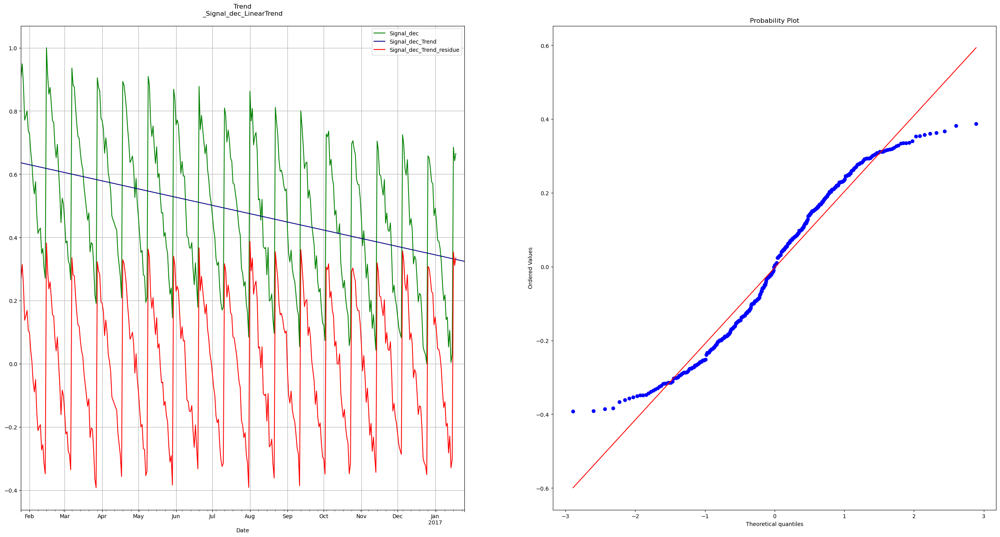

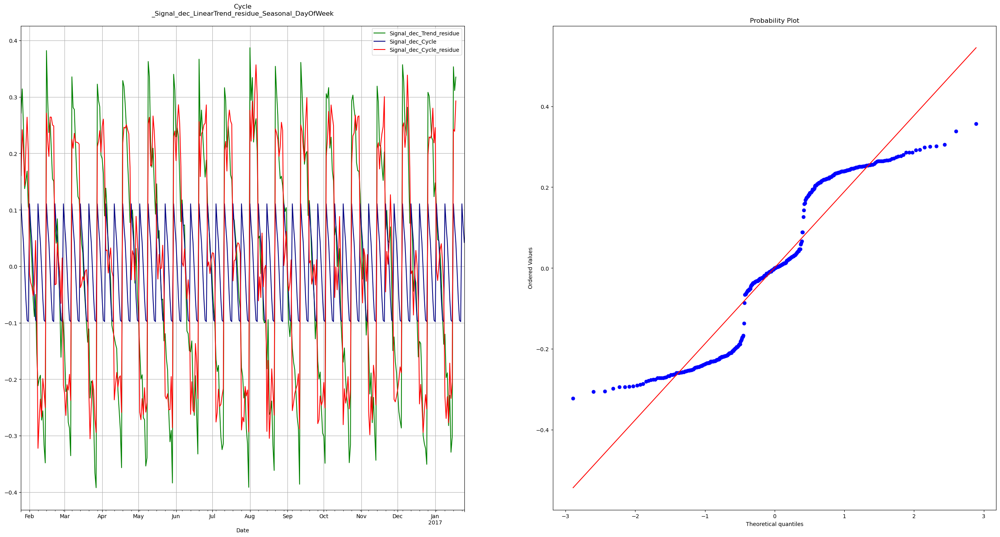

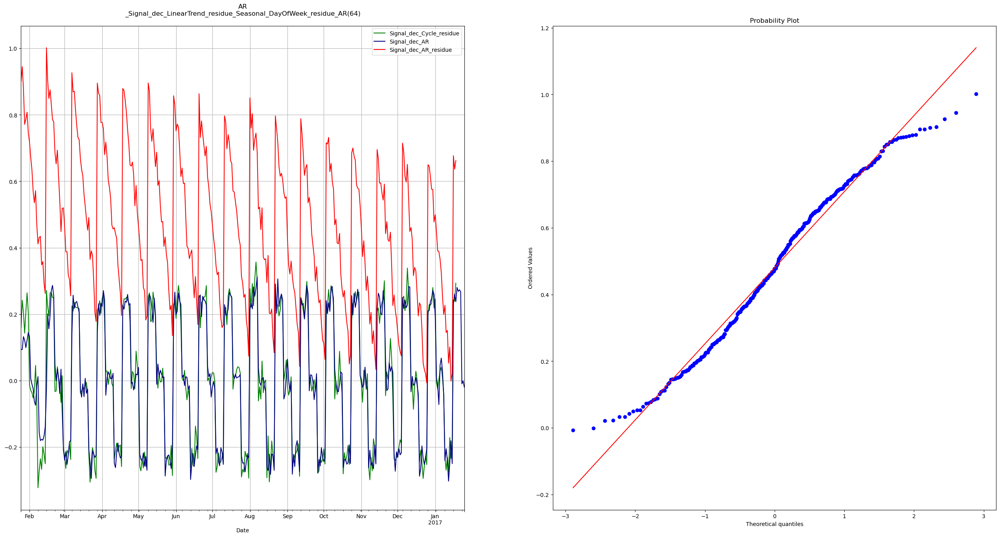

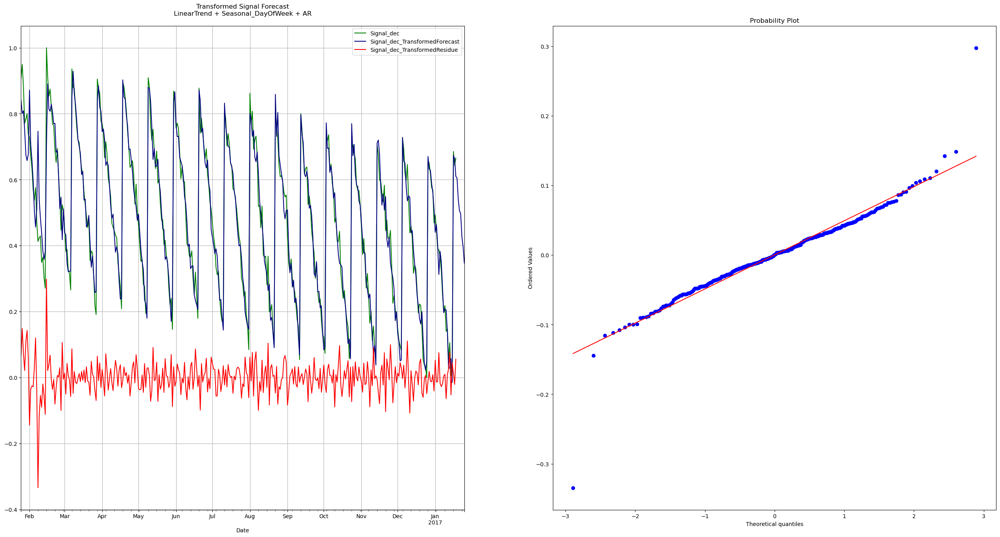

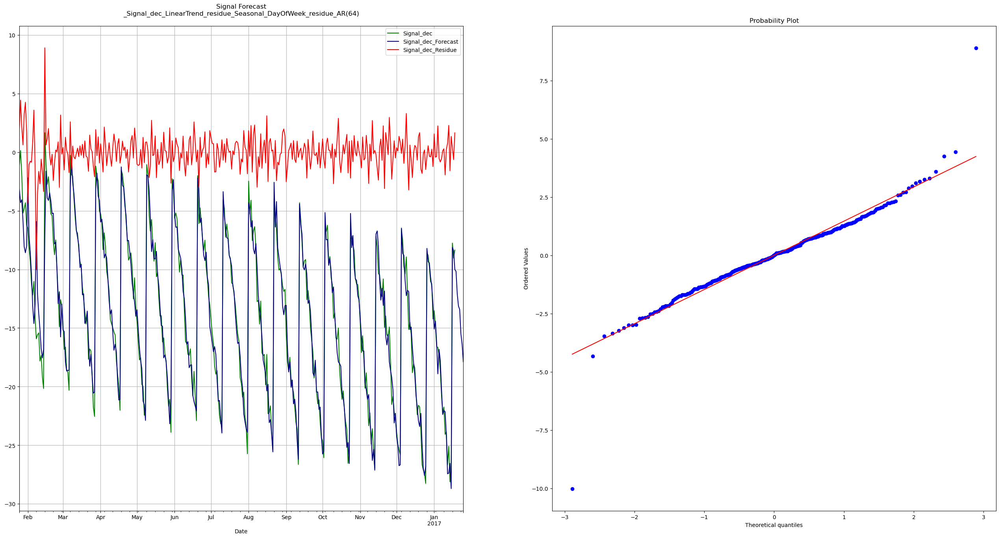

...

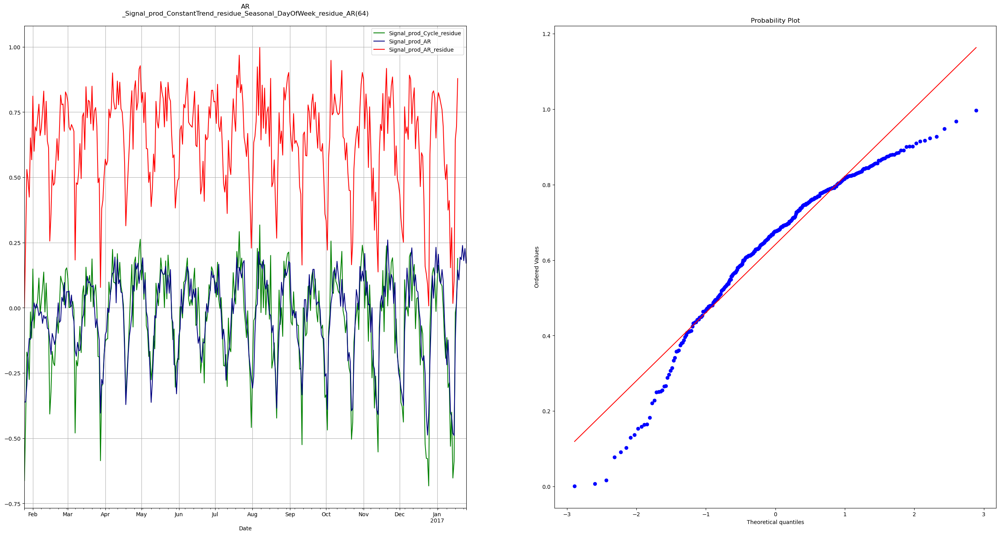

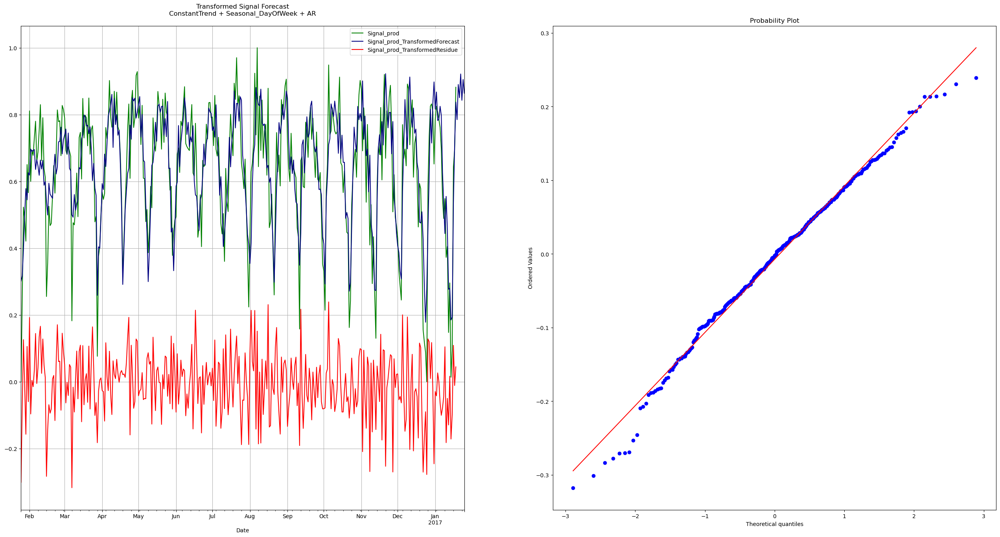

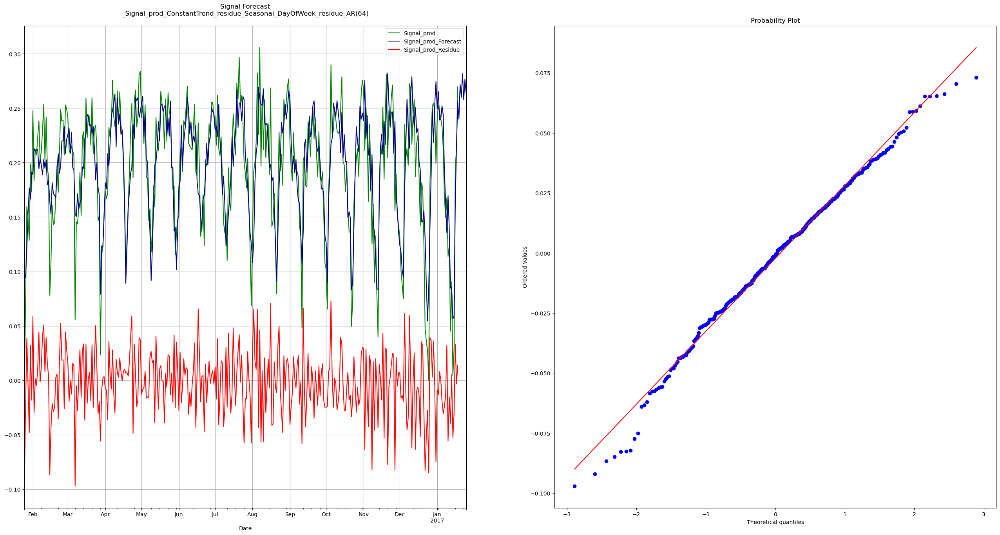

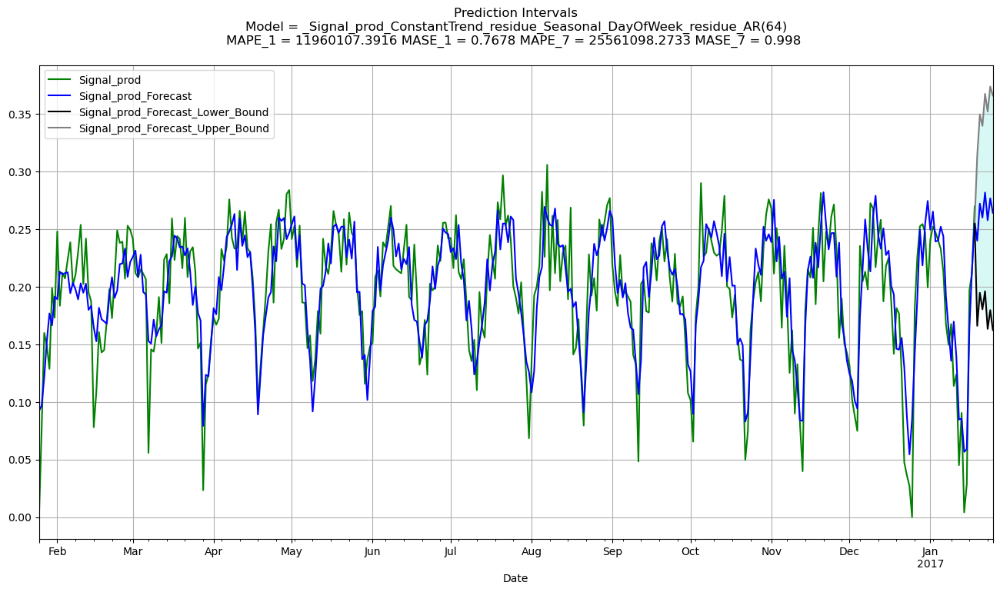

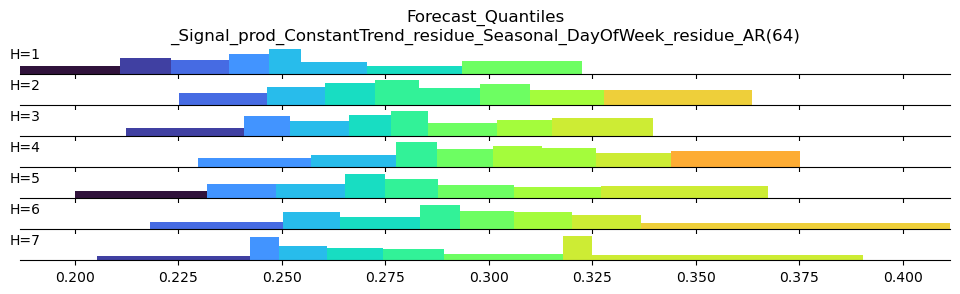

In [6]:
lEngine.standardPlots()

In [7]:

# predict one week
df_forecast = lEngine.forecast(iInputDS = df_train, iHorizon = 7)
# list the columns of the forecast dataset
print(df_forecast.columns) #

# print the real forecasts
print(df_forecast['Date'].tail(7).values)

print(df_forecast['Signal_inc_Forecast'].tail(7).values)
print(df_forecast['Signal_dec_Forecast'].tail(7).values)
print(df_forecast['Signal_mean_Forecast'].tail(7).values)
print(df_forecast['Signal_prod_Forecast'].tail(7).values)

INFO:pyaf.std:FORECASTING_ENGINE_START {'Signals': ['Signal_dec', 'Signal_inc', 'Signal_mean', 'Signal_prod'], 'Horizons': {'Signal_dec': 7, 'Signal_inc': 7, 'Signal_mean': 7, 'Signal_prod': 7}}
INFO:pyaf.std:FORECASTING_ENGINE_END 0.416


Index(['Date', 'Signal_dec', 'row_number', 'Date_Normalized',
       'Signal_dec_scaled', '_Signal_dec', '_Signal_dec_LinearTrend',
       '_Signal_dec_LinearTrend_residue',
       '_Signal_dec_LinearTrend_residue_Seasonal_DayOfWeek',
       '_Signal_dec_LinearTrend_residue_Seasonal_DayOfWeek_residue',
       ...
       'Signal_prod_Forecast_Upper_Bound', 'Signal_prod_Forecast_Quantile_2',
       'Signal_prod_Forecast_Quantile_14', 'Signal_prod_Forecast_Quantile_26',
       'Signal_prod_Forecast_Quantile_38', 'Signal_prod_Forecast_Quantile_50',
       'Signal_prod_Forecast_Quantile_62', 'Signal_prod_Forecast_Quantile_74',
       'Signal_prod_Forecast_Quantile_86', 'Signal_prod_Forecast_Quantile_98'],
      dtype='object', length=131)
['2017-01-19T00:00:00.000000000' '2017-01-20T00:00:00.000000000'
 '2017-01-21T00:00:00.000000000' '2017-01-22T00:00:00.000000000'
 '2017-01-23T00:00:00.000000000' '2017-01-24T00:00:00.000000000'
 '2017-01-25T00:00:00.000000000']
[12.2984442  13.03242158 13